In [282]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [283]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = (12,8)
from sklearn.preprocessing import MinMaxScaler , StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score,f1_score, ConfusionMatrixDisplay


In [284]:
initial_dataset = pd.read_csv('/content/drive/MyDrive/House_price_prediction/House_price.csv')
initial_dataset.head()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus
0,13300000,7420,4,2,3,yes,no,no,no,yes,2,yes,furnished
1,12250000,8960,4,4,4,yes,no,no,no,yes,3,no,furnished
2,12250000,9960,3,2,2,yes,no,yes,no,no,2,yes,semi-furnished
3,12215000,7500,4,2,2,yes,no,yes,no,yes,3,yes,furnished
4,11410000,7420,4,1,2,yes,yes,yes,no,yes,2,no,furnished


In [285]:
initial_dataset.info()
print("---------------------")
"Dataset Shape:" ,initial_dataset.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 545 entries, 0 to 544
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   price             545 non-null    int64 
 1   area              545 non-null    int64 
 2   bedrooms          545 non-null    int64 
 3   bathrooms         545 non-null    int64 
 4   stories           545 non-null    int64 
 5   mainroad          545 non-null    object
 6   guestroom         545 non-null    object
 7   basement          545 non-null    object
 8   hotwaterheating   545 non-null    object
 9   airconditioning   545 non-null    object
 10  parking           545 non-null    int64 
 11  prefarea          545 non-null    object
 12  furnishingstatus  545 non-null    object
dtypes: int64(6), object(7)
memory usage: 55.5+ KB
---------------------


('Dataset Shape:', (545, 13))

In [286]:
initial_dataset.isnull().sum()

price               0
area                0
bedrooms            0
bathrooms           0
stories             0
mainroad            0
guestroom           0
basement            0
hotwaterheating     0
airconditioning     0
parking             0
prefarea            0
furnishingstatus    0
dtype: int64

<Axes: >

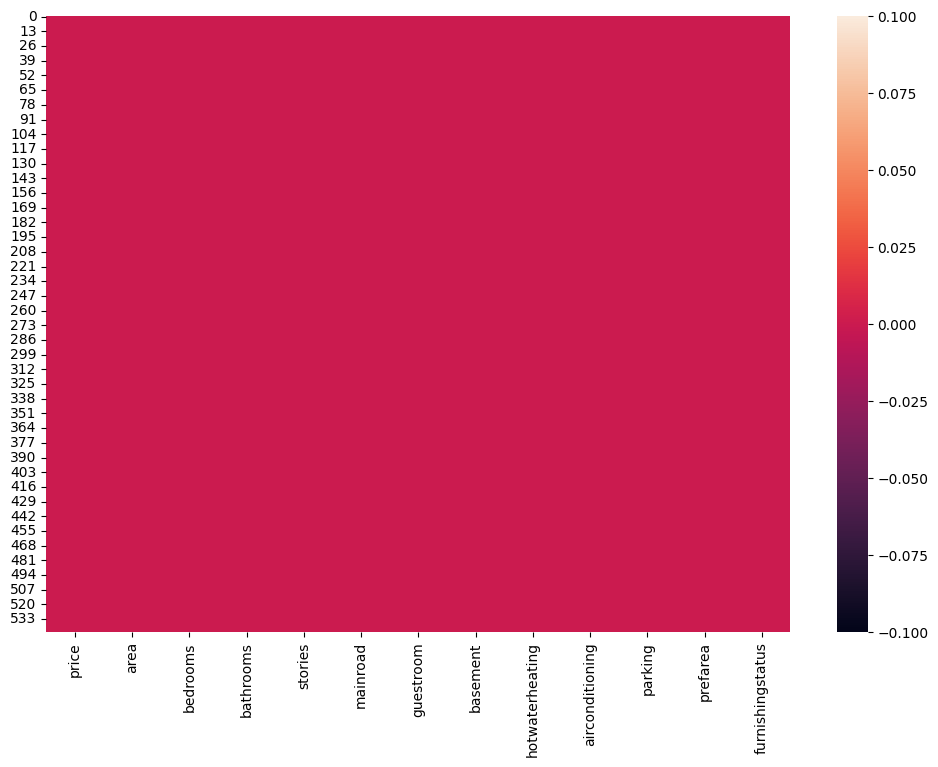

In [287]:
plt.figure(figsize=(12,8))
sns.heatmap(initial_dataset.isnull()) #white lines are null values

In [288]:
initial_dataset.describe()

,price,area,bedrooms,bathrooms,stories,parking
count,5.450000e+02,545.000000,545.000000,545.000000,545.000000,545.000000
mean,4.766729e+06,5150.541284,2.965138,1.286239,1.805505,0.693578
std,1.870440e+06,2170.141023,0.738064,0.502470,0.867492,0.861586
min,1.750000e+06,1650.000000,1.000000,1.000000,1.000000,0.000000
25%,3.430000e+06,3600.000000,2.000000,1.000000,1.000000,0.000000
50%,4.340000e+06,4600.000000,3.000000,1.000000,2.000000,0.000000
75%,5.740000e+06,6360.000000,3.000000,2.000000,2.000000,1.000000
max,1.330000e+07,16200.000000,6.000000,4.000000,4.000000,3.000000


price
3500000     17
4200000     17
4900000     12
3150000      9
5600000      9
            ..
6580000      1
4319000      1
4375000      1
4382000      1
13300000     1
Name: count, Length: 219, dtype: int64


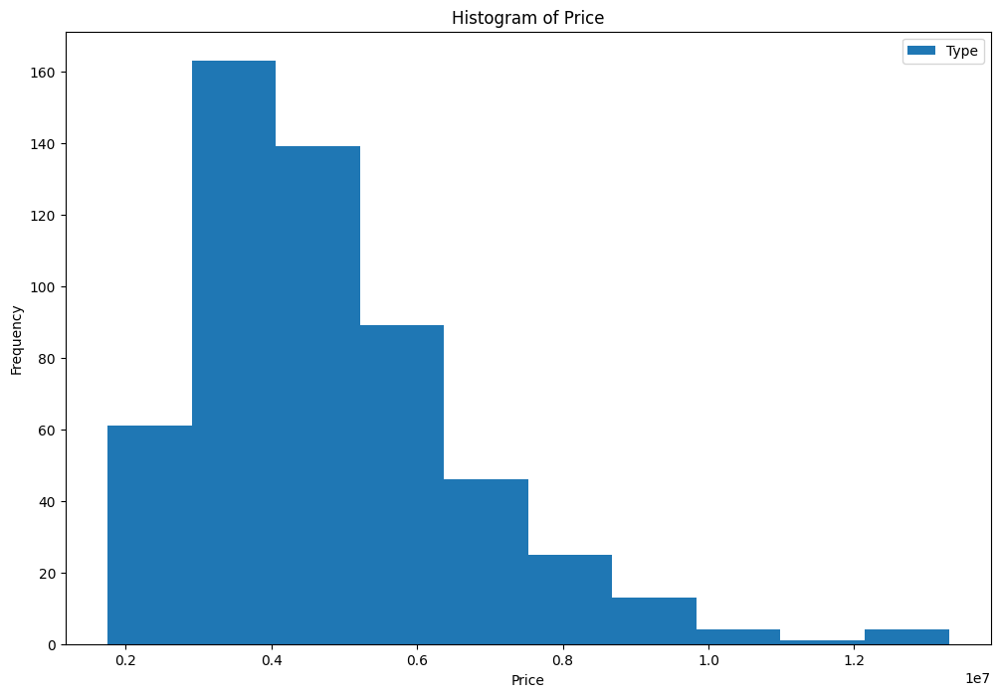

In [289]:
print(initial_dataset["price"].value_counts())
initial_dataset['price'].plot(kind='hist', label="Type")
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Histogram of Price')
plt.legend()
plt.show()


In [290]:

areahist= px.histogram(initial_dataset, x='area', color="price", title="Distribution of Salary cases with area")
areahist.show()

In [291]:

bedhist= px.histogram(initial_dataset, x='bedrooms', color="price", title="Distribution of price cases with bedrooms")
bedhist.show()

In [292]:

furhist= px.histogram(initial_dataset, x='furnishingstatus', color="price", title="Distribution of price cases with furnishingstatus")
furhist.show()

In [293]:

airhist= px.histogram(initial_dataset, x='airconditioning', color="price", title="Distribution of price  with aircondition")
airhist.show()

In [294]:
Parkhist= px.histogram(initial_dataset, x='parking', color="price", title="Distribution of price with parking")
Parkhist.show()

In [295]:
sthist= px.histogram(initial_dataset, x='price', color="stories", title="Distribution of price with stories")
sthist.show()

In [296]:
roadhist= px.histogram(initial_dataset, x='price', color="mainroad", title="Distribution of price with mainroad")
roadhist.show()

In [297]:

pltbl = ['area', 'price']
cm = plt.cm.get_cmap('Greens')  # Get the colormap from Matplotlib
crosstab_data = pd.crosstab(initial_dataset[pltbl[0]], initial_dataset[pltbl[1]], normalize='columns') * 100
styled_crosstab = (round(crosstab_data, 2)).style.background_gradient(cmap=cm)

# Display the styled dataframe
styled_crosstab

In [298]:
pltbl = ['bedrooms', 'price']
cm = plt.cm.get_cmap('Greens')  # Get the colormap from Matplotlib
crosstab_data = pd.crosstab(initial_dataset[pltbl[0]], initial_dataset[pltbl[1]], normalize='columns') * 100
styled_crosstab = (round(crosstab_data, 2)).style.background_gradient(cmap=cm)

# Display the styled dataframe
styled_crosstab

price,1750000,1767150,1820000,1855000,1890000,1960000,2100000,2135000,2233000,2240000,2275000,2310000,2345000,2380000,2408000,2450000,2485000,2520000,2590000,2604000,2653000,2660000,2695000,2730000,2800000,2835000,2852500,2870000,2940000,2961000,2975000,3003000,3010000,3045000,3080000,3087000,3115000,3118850,3129000,3143000,3150000,3220000,3234000,3255000,3290000,3325000,3332000,3353000,3360000,3395000,3423000,3430000,3465000,3493000,3500000,3535000,3570000,3605000,3633000,3640000,3675000,3703000,3710000,3745000,3773000,3780000,3815000,3836000,3850000,3885000,3920000,3990000,4007500,4025000,4060000,4095000,4098500,4123000,4130000,4165000,4193000,4200000,4235000,4270000,4277000,4305000,4319000,4340000,4375000,4382000,4403000,4410000,4445000,4473000,4480000,4515000,4543000,4550000,4585000,4613000,4620000,4655000,4690000,4753000,4760000,4767000,4795000,4830000,4865000,4893000,4900000,4907000,4935000,4956000,4970000,5005000,5033000,5040000,5075000,5110000,5145000,5215000,5229000,5243000,5250000,5285000,5320000,5383000,5390000,5425000,5460000,5495000,5523000,5530000,5565000,5600000,5652500,5740000,5775000,5803000,5810000,5866000,5873000,5880000,5943000,5950000,6020000,6083000,6090000,6107500,6125000,6160000,6195000,6230000,6265000,6293000,6300000,6405000,6419000,6440000,6475000,6510000,6580000,6615000,6629000,6650000,6685000,6720000,6755000,6790000,6860000,6895000,6930000,7000000,7035000,7070000,7140000,7210000,7245000,7343000,7350000,7420000,7455000,7490000,7525000,7560000,7700000,7840000,7875000,7910000,7962500,7980000,8043000,8080940,8120000,8190000,8295000,8400000,8463000,8540000,8575000,8645000,8680000,8750000,8855000,8890000,8960000,9100000,9240000,9310000,9681000,9800000,9870000,10150000,10850000,11410000,12215000,12250000,13300000
bedrooms,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.330000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,33.330000,0.000000,100.000000,1

In [299]:
pltbl = ['parking', 'price']
cm = plt.cm.get_cmap('Greens')  # Get the colormap from Matplotlib
crosstab_data = pd.crosstab(initial_dataset[pltbl[0]], initial_dataset[pltbl[1]], normalize='columns') * 100
styled_crosstab = (round(crosstab_data, 2)).style.background_gradient(cmap=cm)

# Display the styled dataframe
styled_crosstab

price,1750000,1767150,1820000,1855000,1890000,1960000,2100000,2135000,2233000,2240000,2275000,2310000,2345000,2380000,2408000,2450000,2485000,2520000,2590000,2604000,2653000,2660000,2695000,2730000,2800000,2835000,2852500,2870000,2940000,2961000,2975000,3003000,3010000,3045000,3080000,3087000,3115000,3118850,3129000,3143000,3150000,3220000,3234000,3255000,3290000,3325000,3332000,3353000,3360000,3395000,3423000,3430000,3465000,3493000,3500000,3535000,3570000,3605000,3633000,3640000,3675000,3703000,3710000,3745000,3773000,3780000,3815000,3836000,3850000,3885000,3920000,3990000,4007500,4025000,4060000,4095000,4098500,4123000,4130000,4165000,4193000,4200000,4235000,4270000,4277000,4305000,4319000,4340000,4375000,4382000,4403000,4410000,4445000,4473000,4480000,4515000,4543000,4550000,4585000,4613000,4620000,4655000,4690000,4753000,4760000,4767000,4795000,4830000,4865000,4893000,4900000,4907000,4935000,4956000,4970000,5005000,5033000,5040000,5075000,5110000,5145000,5215000,5229000,5243000,5250000,5285000,5320000,5383000,5390000,5425000,5460000,5495000,5523000,5530000,5565000,5600000,5652500,5740000,5775000,5803000,5810000,5866000,5873000,5880000,5943000,5950000,6020000,6083000,6090000,6107500,6125000,6160000,6195000,6230000,6265000,6293000,6300000,6405000,6419000,6440000,6475000,6510000,6580000,6615000,6629000,6650000,6685000,6720000,6755000,6790000,6860000,6895000,6930000,7000000,7035000,7070000,7140000,7210000,7245000,7343000,7350000,7420000,7455000,7490000,7525000,7560000,7700000,7840000,7875000,7910000,7962500,7980000,8043000,8080940,8120000,8190000,8295000,8400000,8463000,8540000,8575000,8645000,8680000,8750000,8855000,8890000,8960000,9100000,9240000,9310000,9681000,9800000,9870000,10150000,10850000,11410000,12215000,12250000,13300000
parking,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,100.000000,100.000000,0.000000,0.000000,100.000000,100.000000,66.670000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,66.670000,100.000000,100.000000,66.670000,100.000000,100.000000,85.710000,100.000000,50.000000,50.000000,0.000000,100.000000,100.000000,62.500000,100.000000,0.000000,100.000000,71.430000,100.000000,75.000000,0.000000,100.000000,100.000000,100.000000,100.000000,55.560000,50.000000,100.000000,100.000000,75.000000,50.000000,100.000000,100.000000,75.000000,33.330000,100.000000,83.330000,66.670000,100.000000,58.820000,0.000000,75.000000,100.000000,0.000000,77.780000,100.000000,100.000000,80.000000,100.000000,0.000000,50.000000,100.000000,100.000000,85.710000,100.000000,42.860000,80.000000,100.000000,0.000000,20.000000,66.670000,100.000000,0.000000,100.000000,0.000000,0.000000,64.710000,100.000000,66.670000,0.000000,0.000000,100.000000,40.000000,100.000000,100.000000,33.330000,100.000000,100.000000,33.330000,20.000000,75.000000,100.000000,57.140000,0.000000,100.000000,60.000000,100.000000,50.000000,0.000000,0.000000,100.000000,50.000000,50.000000,100.000000,50.000000,66.670000,0.000000,100.000000,0.000000,50.000000,100.000000,100.000000,75.000000,100.000000,100.000000,50.000000,0.000000,0.000000,100.000000,44.440000,0.000000,0.000000,100.000000,0.000000,100.000000,100.000000,0.000000,100.000000,33.330000,50.000000,55.560000,0.000000,40.000000,100.000000,0.000000,100.000000,100.000000,0.000000,50.000000,0.000000,50.000000,33.330000,50.000000,0.000000,0.000000,100.000000,100.000000,33.330000,50.000000,100.000000,100.000000,0.000000,100.000000,0.000000,50.000000,0.000000,66.670000,100.000000,0.000000,0.000000,66.670000,100.000000,100.000000,100.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.330000,0.000000,0.000000,0.000000,50.000000,0.000000,100.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000

In [300]:
pltbl = ['furnishingstatus', 'price']
cm = plt.cm.get_cmap('Greens')  # Get the colormap from Matplotlib
crosstab_data = pd.crosstab(initial_dataset[pltbl[0]], initial_dataset[pltbl[1]], normalize='columns') * 100
styled_crosstab = (round(crosstab_data, 2)).style.background_gradient(cmap=cm)

# Display the styled dataframe
styled_crosstab

price,1750000,1767150,1820000,1855000,1890000,1960000,2100000,2135000,2233000,2240000,2275000,2310000,2345000,2380000,2408000,2450000,2485000,2520000,2590000,2604000,2653000,2660000,2695000,2730000,2800000,2835000,2852500,2870000,2940000,2961000,2975000,3003000,3010000,3045000,3080000,3087000,3115000,3118850,3129000,3143000,3150000,3220000,3234000,3255000,3290000,3325000,3332000,3353000,3360000,3395000,3423000,3430000,3465000,3493000,3500000,3535000,3570000,3605000,3633000,3640000,3675000,3703000,3710000,3745000,3773000,3780000,3815000,3836000,3850000,3885000,3920000,3990000,4007500,4025000,4060000,4095000,4098500,4123000,4130000,4165000,4193000,4200000,4235000,4270000,4277000,4305000,4319000,4340000,4375000,4382000,4403000,4410000,4445000,4473000,4480000,4515000,4543000,4550000,4585000,4613000,4620000,4655000,4690000,4753000,4760000,4767000,4795000,4830000,4865000,4893000,4900000,4907000,4935000,4956000,4970000,5005000,5033000,5040000,5075000,5110000,5145000,5215000,5229000,5243000,5250000,5285000,5320000,5383000,5390000,5425000,5460000,5495000,5523000,5530000,5565000,5600000,5652500,5740000,5775000,5803000,5810000,5866000,5873000,5880000,5943000,5950000,6020000,6083000,6090000,6107500,6125000,6160000,6195000,6230000,6265000,6293000,6300000,6405000,6419000,6440000,6475000,6510000,6580000,6615000,6629000,6650000,6685000,6720000,6755000,6790000,6860000,6895000,6930000,7000000,7035000,7070000,7140000,7210000,7245000,7343000,7350000,7420000,7455000,7490000,7525000,7560000,7700000,7840000,7875000,7910000,7962500,7980000,8043000,8080940,8120000,8190000,8295000,8400000,8463000,8540000,8575000,8645000,8680000,8750000,8855000,8890000,8960000,9100000,9240000,9310000,9681000,9800000,9870000,10150000,10850000,11410000,12215000,12250000,13300000
furnishingstatus,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
furnished,33.330000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,66.670000,0.000000,0.000000,0.000000,33.330000,33.330000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,33.330000,0.000000,0.000000,12.500000,0.000000,0.000000,0.000000,14.290000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.110000,25.000000,0.000000,0.000000,25.000000,0.000000,100.000000,100.000000,12.500000,66.670000,0.000000,16.670000,33.330000,0.000000,5.880000,0.000000,75.000000,0.000000,0.000000,11.110000,50.000000,50.000000,20.000000,0.000000,100.000000,33.330000,0.000000,0.000000,14.290000,50.000000,42.860000,20.000000,0.000000,33.330000,20.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,11.760000,50.000000,66.670000,0.000000,0.000000,100.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,66.670000,40.000000,25.000000,50.000000,28.570000,50.000000,0.000000,0.000000,100.000000,16.670000,0.000000,33.330000,0.000000,0.000000,25.000000,0.000000,0.000000,8.330000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,50.000000,0.000000,33.330000,0.000000,0.000000,22.220000,0.000000,0.000000,0.000000,100.000000,0.000000,50.000000,50.000000,0.000000,33.330000,50.000000,22.220000,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.000000,62.500000,33.330000,100.000000,0.000000,0.000000,0.000000,0.000000,66.670000,0.000000,0.000000,0.000000,20.000000,100.000000,100.000000,50.000000,0.000000,33.330000,0.000000,50.000000,0.000000,83.330000,100.000000,0.000000,0.000000,50.000000,100.000000,0.000000,100.000000,100.000000,100.000000,50.000000,0.000000,50.000000,100.000000,0.000000,25.000000,0.000000,0.000000,100.000000,100.000000,50.000000,0.000000,100.000000,100.000000,0.000000,0.000000,100.000000,100.000000,100.000000,100.000000,0.000000,100.000000,0.000000,0.000000,100.000000,100.000000,100.000000,0.000000,0.000000,0.000000,100.000000,100.000000,0

In [301]:
pltbl = ['mainroad', 'price']
cm = plt.cm.get_cmap('Greens')  # Get the colormap from Matplotlib
crosstab_data = pd.crosstab(initial_dataset[pltbl[0]], initial_dataset[pltbl[1]], normalize='columns') * 100
styled_crosstab = (round(crosstab_data, 2)).style.background_gradient(cmap=cm)

# Display the styled dataframe
styled_crosstab

price,1750000,1767150,1820000,1855000,1890000,1960000,2100000,2135000,2233000,2240000,2275000,2310000,2345000,2380000,2408000,2450000,2485000,2520000,2590000,2604000,2653000,2660000,2695000,2730000,2800000,2835000,2852500,2870000,2940000,2961000,2975000,3003000,3010000,3045000,3080000,3087000,3115000,3118850,3129000,3143000,3150000,3220000,3234000,3255000,3290000,3325000,3332000,3353000,3360000,3395000,3423000,3430000,3465000,3493000,3500000,3535000,3570000,3605000,3633000,3640000,3675000,3703000,3710000,3745000,3773000,3780000,3815000,3836000,3850000,3885000,3920000,3990000,4007500,4025000,4060000,4095000,4098500,4123000,4130000,4165000,4193000,4200000,4235000,4270000,4277000,4305000,4319000,4340000,4375000,4382000,4403000,4410000,4445000,4473000,4480000,4515000,4543000,4550000,4585000,4613000,4620000,4655000,4690000,4753000,4760000,4767000,4795000,4830000,4865000,4893000,4900000,4907000,4935000,4956000,4970000,5005000,5033000,5040000,5075000,5110000,5145000,5215000,5229000,5243000,5250000,5285000,5320000,5383000,5390000,5425000,5460000,5495000,5523000,5530000,5565000,5600000,5652500,5740000,5775000,5803000,5810000,5866000,5873000,5880000,5943000,5950000,6020000,6083000,6090000,6107500,6125000,6160000,6195000,6230000,6265000,6293000,6300000,6405000,6419000,6440000,6475000,6510000,6580000,6615000,6629000,6650000,6685000,6720000,6755000,6790000,6860000,6895000,6930000,7000000,7035000,7070000,7140000,7210000,7245000,7343000,7350000,7420000,7455000,7490000,7525000,7560000,7700000,7840000,7875000,7910000,7962500,7980000,8043000,8080940,8120000,8190000,8295000,8400000,8463000,8540000,8575000,8645000,8680000,8750000,8855000,8890000,8960000,9100000,9240000,9310000,9681000,9800000,9870000,10150000,10850000,11410000,12215000,12250000,13300000
mainroad,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
no,33.330000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,100.000000,100.000000,66.670000,0.000000,0.000000,0.000000,100.000000,16.670000,50.000000,66.670000,0.000000,100.000000,0.000000,28.570000,0.000000,0.000000,0.000000,100.000000,0.000000,25.000000,62.500000,0.000000,100.000000,0.000000,28.570000,0.000000,25.000000,0.000000,33.330000,0.000000,0.000000,0.000000,33.330000,50.000000,0.000000,100.000000,25.000000,0.000000,0.000000,100.000000,37.500000,0.000000,0.000000,0.000000,0.000000,100.000000,17.650000,0.000000,25.000000,0.000000,0.000000,22.220000,25.000000,50.000000,0.000000,0.000000,66.670000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,60.000000,50.000000,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.410000,0.000000,16.670000,0.000000,0.000000,0.000000,20.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.330000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,25.000000,0.000000,0.000000,50.000000,33.330000,0.000000,0.000000,11.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.000000,0.000000,11.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [302]:
pltbl = ['prefarea', 'price']
cm = plt.cm.get_cmap('Greens')  # Get the colormap from Matplotlib
crosstab_data = pd.crosstab(initial_dataset[pltbl[0]], initial_dataset[pltbl[1]], normalize='columns') * 100
styled_crosstab = (round(crosstab_data, 2)).style.background_gradient(cmap=cm)

# Display the styled dataframe
styled_crosstab

price,1750000,1767150,1820000,1855000,1890000,1960000,2100000,2135000,2233000,2240000,2275000,2310000,2345000,2380000,2408000,2450000,2485000,2520000,2590000,2604000,2653000,2660000,2695000,2730000,2800000,2835000,2852500,2870000,2940000,2961000,2975000,3003000,3010000,3045000,3080000,3087000,3115000,3118850,3129000,3143000,3150000,3220000,3234000,3255000,3290000,3325000,3332000,3353000,3360000,3395000,3423000,3430000,3465000,3493000,3500000,3535000,3570000,3605000,3633000,3640000,3675000,3703000,3710000,3745000,3773000,3780000,3815000,3836000,3850000,3885000,3920000,3990000,4007500,4025000,4060000,4095000,4098500,4123000,4130000,4165000,4193000,4200000,4235000,4270000,4277000,4305000,4319000,4340000,4375000,4382000,4403000,4410000,4445000,4473000,4480000,4515000,4543000,4550000,4585000,4613000,4620000,4655000,4690000,4753000,4760000,4767000,4795000,4830000,4865000,4893000,4900000,4907000,4935000,4956000,4970000,5005000,5033000,5040000,5075000,5110000,5145000,5215000,5229000,5243000,5250000,5285000,5320000,5383000,5390000,5425000,5460000,5495000,5523000,5530000,5565000,5600000,5652500,5740000,5775000,5803000,5810000,5866000,5873000,5880000,5943000,5950000,6020000,6083000,6090000,6107500,6125000,6160000,6195000,6230000,6265000,6293000,6300000,6405000,6419000,6440000,6475000,6510000,6580000,6615000,6629000,6650000,6685000,6720000,6755000,6790000,6860000,6895000,6930000,7000000,7035000,7070000,7140000,7210000,7245000,7343000,7350000,7420000,7455000,7490000,7525000,7560000,7700000,7840000,7875000,7910000,7962500,7980000,8043000,8080940,8120000,8190000,8295000,8400000,8463000,8540000,8575000,8645000,8680000,8750000,8855000,8890000,8960000,9100000,9240000,9310000,9681000,9800000,9870000,10150000,10850000,11410000,12215000,12250000,13300000
prefarea,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
no,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,0.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,0.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,87.500000,100.000000,0.000000,100.000000,100.000000,100.000000,100.000000,50.000000,33.330000,100.000000,88.240000,100.000000,100.000000,50.000000,0.000000,77.780000,100.000000,100.000000,100.000000,0.000000,100.000000,83.330000,100.000000,100.000000,71.430000,100.000000,85.710000,80.000000,100.000000,100.000000,80.000000,100.000000,0.000000,100.000000,100.000000,100.000000,100.000000,88.240000,50.000000,100.000000,0.000000,50.000000,100.000000,100.000000,100.000000,100.000000,33.330000,100.000000,100.000000,100.000000,100.000000,75.000000,50.000000,57.140000,50.000000,100.000000,80.000000,100.000000,66.670000,100.000000,66.670000,100.000000,100.000000,25.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,75.000000,0.000000,50.000000,50.000000,66.670000,0.000000,0.000000,55.560000,100.000000,0.000000,100.000000,0.000000,0.000000,50.000000,100.000000,0.000000,66.670000,0.000000,66.670000,0.000000,80.000000,100.000000,0.000000,100.000000,100.000000,50.000000,50.000000,100.000000,37.500000,33.330000,50.000000,66.670000,100.000000,0.000000,50.000000,66.670000,0.000000,0.000000,0.000000,60.000000,100.000000,0.000000,100.000000,50.000000,66.670000,100.000000,50.000000,0.000000,50.000000,0.000000,0.000000,100.000000,0.000000,100.000000,100.000000,100.000000,0.000000,0.000000,100.000000,100.000000,100.000000,0.000000,0.000000,100.000000,33.330000,100.000000,0.000000,100.000000,100.000000,100.000000,0.000000,0.000000,100.000000,100.000000,100.000000,0.000

In [303]:
# Define the map function
def binary_map(x):
    return x.map({'yes': 1, "no": 0})

# Fill NaN values with a default value ('no') before applying the mapping function
initial_dataset[varlist] = initial_dataset[varlist].fillna('no').apply(binary_map)
initial_dataset.head()



,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus
0,13300000,7420,4,2,3,1,0,0,0,1,2,1,furnished
1,12250000,8960,4,4,4,1,0,0,0,1,3,0,furnished
2,12250000,9960,3,2,2,1,0,1,0,0,2,1,semi-furnished
3,12215000,7500,4,2,2,1,0,1,0,1,3,1,furnished
4,11410000,7420,4,1,2,1,1,1,0,1,2,0,furnished


In [304]:
initial_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 545 entries, 0 to 544
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   price             545 non-null    int64 
 1   area              545 non-null    int64 
 2   bedrooms          545 non-null    int64 
 3   bathrooms         545 non-null    int64 
 4   stories           545 non-null    int64 
 5   mainroad          545 non-null    int64 
 6   guestroom         545 non-null    int64 
 7   basement          545 non-null    int64 
 8   hotwaterheating   545 non-null    int64 
 9   airconditioning   545 non-null    int64 
 10  parking           545 non-null    int64 
 11  prefarea          545 non-null    int64 
 12  furnishingstatus  545 non-null    object
dtypes: int64(12), object(1)
memory usage: 55.5+ KB


In [305]:
initial_dataset.describe()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea
count,5.450000e+02,545.000000,545.000000,545.000000,545.000000,545.000000,545.000000,545.000000,545.000000,545.000000,545.000000,545.000000
mean,4.766729e+06,5150.541284,2.965138,1.286239,1.805505,0.858716,0.177982,0.350459,0.045872,0.315596,0.693578,0.234862
std,1.870440e+06,2170.141023,0.738064,0.502470,0.867492,0.348635,0.382849,0.477552,0.209399,0.465180,0.861586,0.424302
min,1.750000e+06,1650.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.430000e+06,3600.000000,2.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.340000e+06,4600.000000,3.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,5.740000e+06,6360.000000,3.000000,2.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000
max,1.330000e+07,16200.000000,6.000000,4.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000


In [306]:
initial_dataset.isnull().sum()*100/initial_dataset.shape[0]

price               0.0
area                0.0
bedrooms            0.0
bathrooms           0.0
stories             0.0
mainroad            0.0
guestroom           0.0
basement            0.0
hotwaterheating     0.0
airconditioning     0.0
parking             0.0
prefarea            0.0
furnishingstatus    0.0
dtype: float64

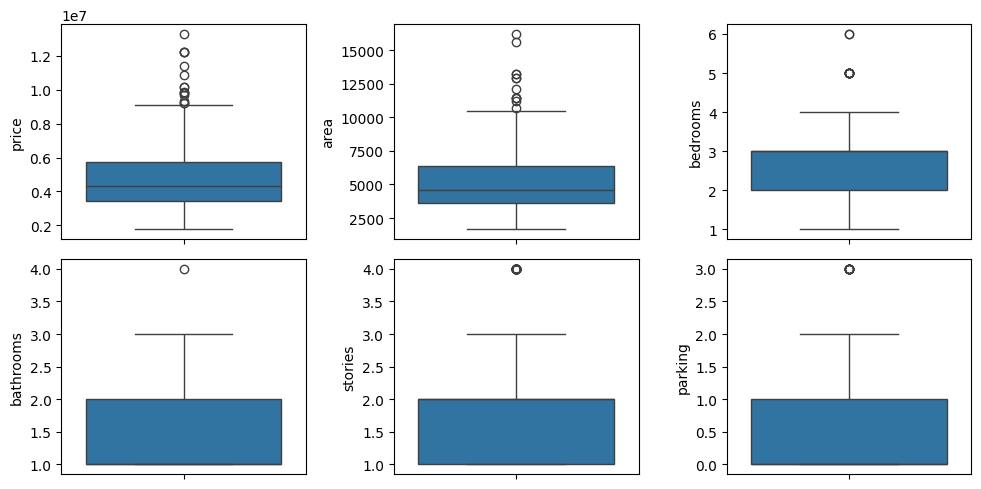

In [307]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(2,3, figsize=(10,5))
plt1 = sns.boxplot(initial_dataset['price'], ax=axs[0,0])
plt2 = sns.boxplot(initial_dataset['area'], ax=axs[0,1])
plt3 = sns.boxplot(initial_dataset['bedrooms'], ax=axs[0,2])
plt4 = sns.boxplot(initial_dataset['bathrooms'], ax=axs[1,0])
plt5 = sns.boxplot(initial_dataset['stories'], ax=axs[1,1])
plt6 = sns.boxplot(initial_dataset['parking'], ax=axs[1,2])

plt.tight_layout()
plt.show()


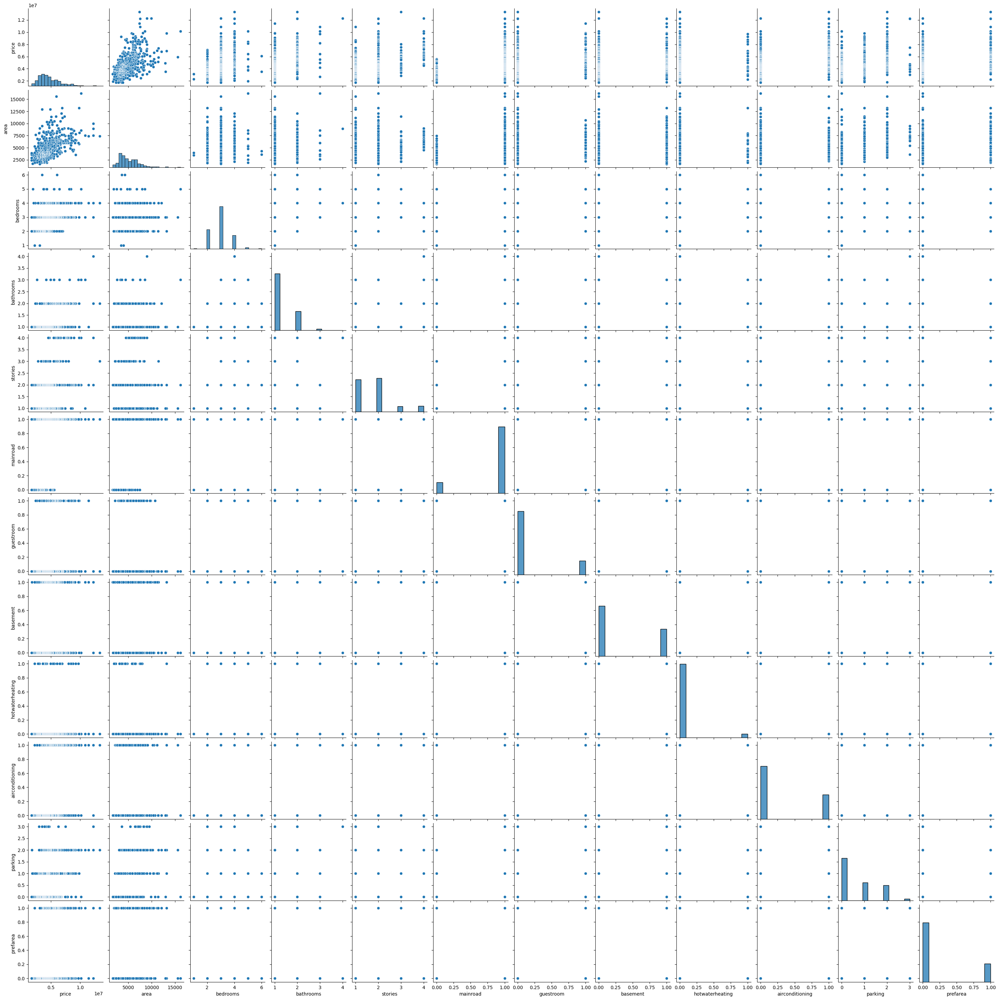

In [308]:
sns.pairplot(initial_dataset)
plt.show()

In [309]:
status = pd.get_dummies(initial_dataset['furnishingstatus'])
status.head()

,furnished,semi-furnished,unfurnished
0,True,False,False
1,True,False,False
2,False,True,False
3,True,False,False
4,True,False,False


In [310]:
status = pd.get_dummies(initial_dataset['furnishingstatus'], drop_first = True)
status.head()

,semi-furnished,unfurnished
0,False,False
1,False,False
2,True,False
3,False,False
4,False,False


In [311]:
initial_dataset = pd.concat([initial_dataset, status], axis = 1)
initial_dataset.head()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus,semi-furnished,unfurnished
0,13300000,7420,4,2,3,1,0,0,0,1,2,1,furnished,False,False
1,12250000,8960,4,4,4,1,0,0,0,1,3,0,furnished,False,False
2,12250000,9960,3,2,2,1,0,1,0,0,2,1,semi-furnished,True,False
3,12215000,7500,4,2,2,1,0,1,0,1,3,1,furnished,False,False
4,11410000,7420,4,1,2,1,1,1,0,1,2,0,furnished,False,False


In [313]:
dataset=initial_dataset.copy()
dataset.head()



,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,semi-furnished,unfurnished
0,13300000,7420,4,2,3,1,0,0,0,1,2,1,False,False
1,12250000,8960,4,4,4,1,0,0,0,1,3,0,False,False
2,12250000,9960,3,2,2,1,0,1,0,0,2,1,True,False
3,12215000,7500,4,2,2,1,0,1,0,1,3,1,False,False
4,11410000,7420,4,1,2,1,1,1,0,1,2,0,False,False


In [315]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
df_train, df_test = train_test_split(dataset, train_size = 0.7, test_size = 0.3, random_state = 100)

In [316]:
from sklearn.preprocessing import MinMaxScaler

In [317]:
scaler = MinMaxScaler()

In [318]:
num_vars = ['area', 'bedrooms', 'bathrooms', 'stories', 'parking','price']

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

In [319]:
df_train.head()

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,semi-furnished,unfurnished
359,0.169697,0.155227,0.4,0.0,0.000000,1,0,0,0,0,0.333333,0,False,True
19,0.615152,0.403379,0.4,0.5,0.333333,1,0,0,0,1,0.333333,1,True,False
159,0.321212,0.115628,0.4,0.5,0.000000,1,1,1,0,1,0.000000,0,False,False
35,0.548133,0.454417,0.4,0.5,1.000000,1,0,0,0,1,0.666667,0,False,False
28,0.575758,0.538015,0.8,0.5,0.333333,1,0,1,1,0,0.666667,0,False,True


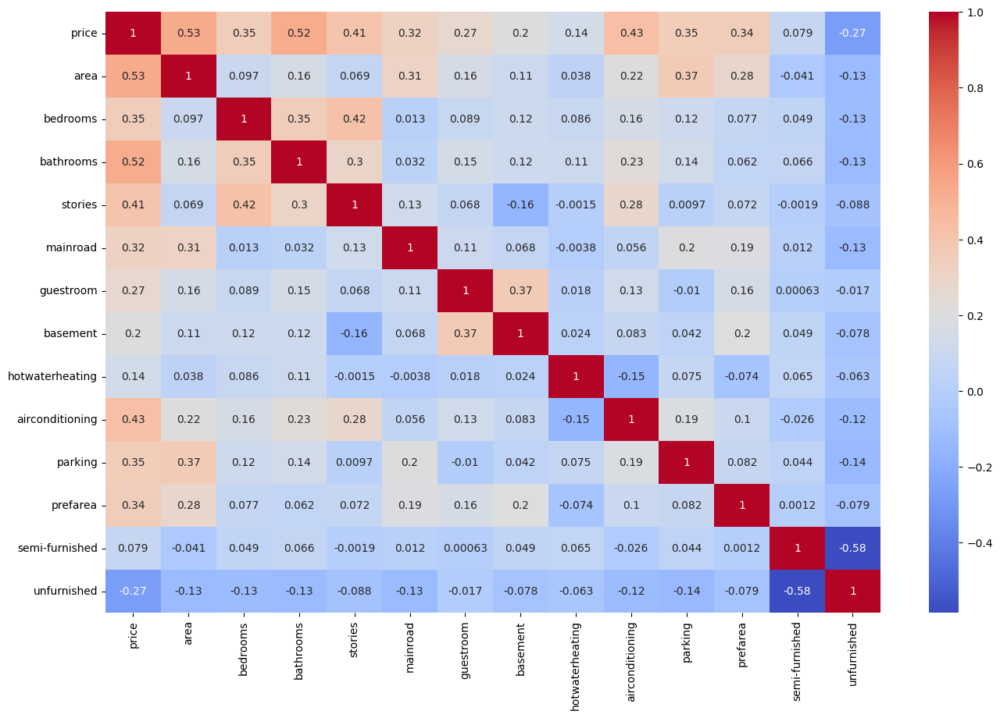

In [322]:
plt.figure(figsize = (16, 10))
sns.heatmap(df_train.corr(), annot = True, cmap="coolwarm")
plt.show()

In [323]:
y_train = df_train.pop('price')
X_train = df_train

In [324]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [325]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [330]:
import sklearn
print(sklearn.__version__)



1.2.2


In [333]:
from sklearn.feature_selection import RFE

# Assuming lm is your estimator and X_train, y_train are your feature and target variables
rfe = RFE(estimator=lm, n_features_to_select=6)
rfe.fit(X_train, y_train)


RFE(estimator=LinearRegression(), n_features_to_select=6)

In [334]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('area', True, 1),
 ('bedrooms', False, 2),
 ('bathrooms', True, 1),
 ('stories', True, 1),
 ('mainroad', False, 3),
 ('guestroom', False, 5),
 ('basement', False, 7),
 ('hotwaterheating', True, 1),
 ('airconditioning', True, 1),
 ('parking', False, 4),
 ('prefarea', True, 1),
 ('semi-furnished', False, 8),
 ('unfurnished', False, 6)]

In [335]:
col = X_train.columns[rfe.support_]
col

Index(['area', 'bathrooms', 'stories', 'hotwaterheating', 'airconditioning',
       'prefarea'],
      dtype='object')

In [336]:
X_train.columns[~rfe.support_]

Index(['bedrooms', 'mainroad', 'guestroom', 'basement', 'parking',
       'semi-furnished', 'unfurnished'],
      dtype='object')

In [337]:
X_train_rfe = X_train[col]

In [338]:
import statsmodels.api as sm
X_train_rfe = sm.add_constant(X_train_rfe)

In [339]:
lm = sm.OLS(y_train,X_train_rfe).fit()

In [340]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.625
Method:                 Least Squares   F-statistic:                     106.7
Date:                Sun, 05 May 2024   Prob (F-statistic):           6.98e-78
Time:                        22:22:14   Log-Likelihood:                 353.86
No. Observations:                 381   AIC:                            -693.7
Df Residuals:                     374   BIC:                            -666.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0659      0.010     

In [341]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = X_train_rfe
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,4.24
5,airconditioning,1.20
2,bathrooms,1.16
3,stories,1.16
1,area,1.15
6,prefarea,1.10
4,hotwaterheating,1.06


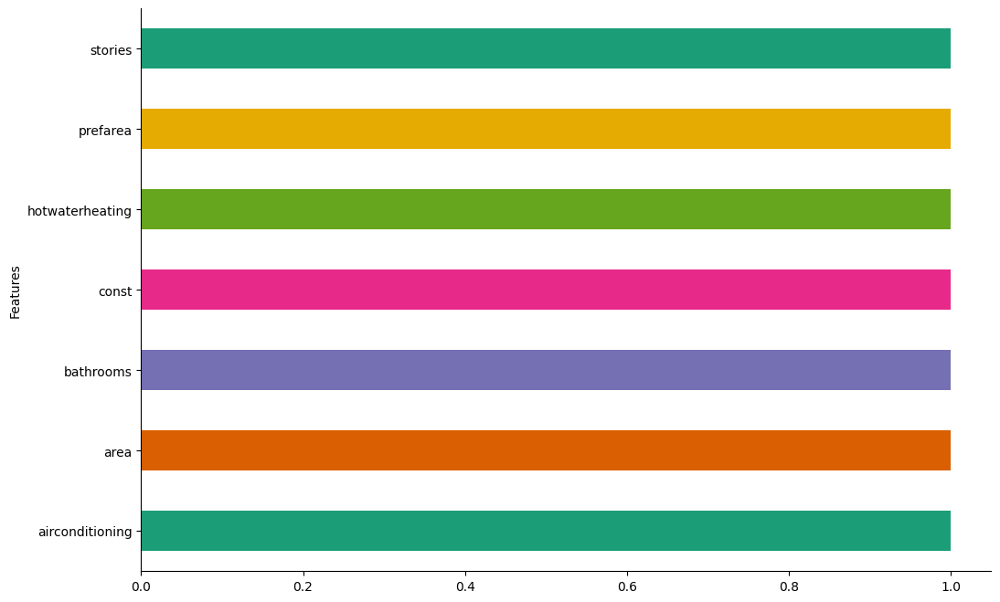

In [343]:


from matplotlib import pyplot as plt
import seaborn as sns
vif.groupby('Features').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

Text(0.5, 0, 'Errors')

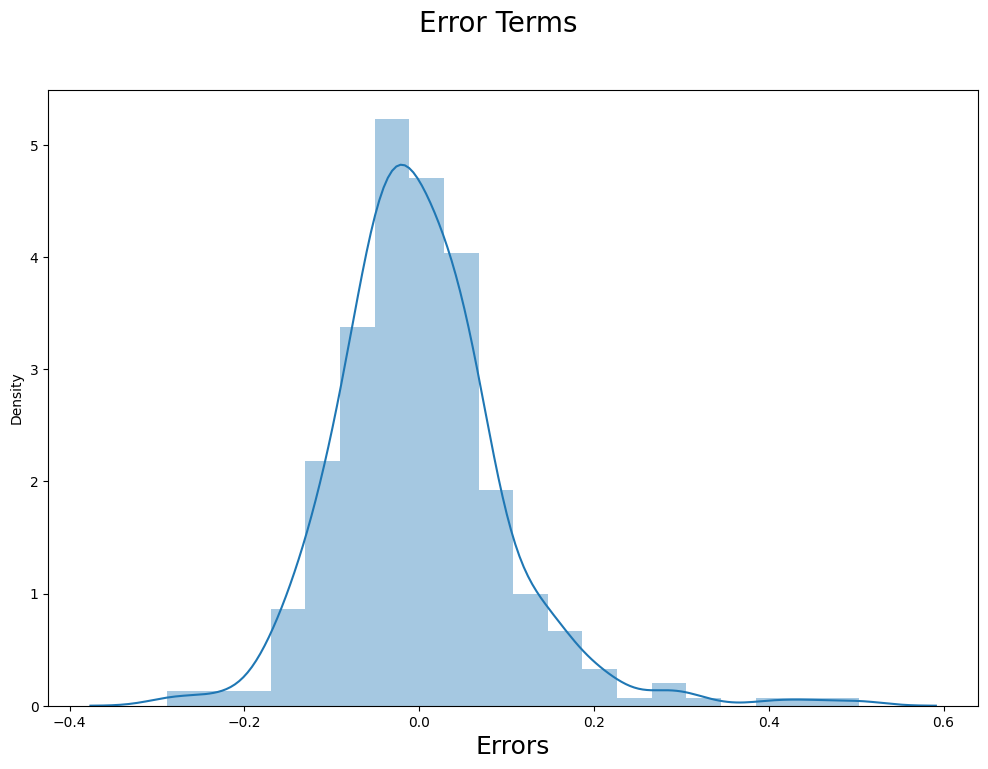

In [344]:
y_train_price = lm.predict(X_train_rfe)
res = (y_train_price - y_train)
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_price), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading
plt.xlabel('Errors', fontsize = 18)

In [345]:
num_vars = ['area','stories', 'bathrooms', 'airconditioning', 'prefarea','parking','price']
df_test[num_vars] = scaler.fit_transform(df_test[num_vars])

In [346]:
y_test = df_test.pop('price')
X_test = df_test
# Adding constant variable to test dataframe
X_test = sm.add_constant(X_test)
X_test_rfe = X_test[X_train_rfe.columns]

In [348]:
y_pred = lm.predict(X_test_rfe)


In [349]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.5350445027578827

Text(0, 0.5, 'y_pred')

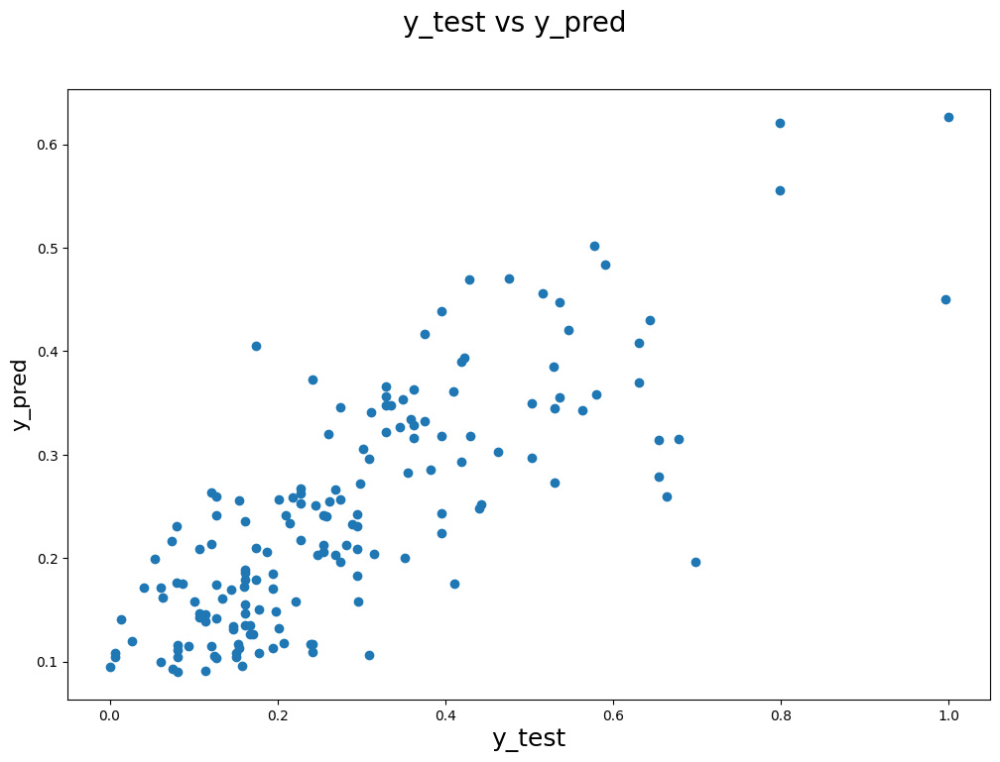

In [350]:
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)